In [28]:
import pennylane as qml
import torch
import numpy as np
import random
import torch.nn as nn
from tqdm import tqdm

In [29]:
import functools
import inspect
import math
from collections.abc import Iterable
from typing import Callable, Dict, Union, Any

from pennylane import QNode

try:
    import torch
    from torch.nn import Module

    TORCH_IMPORTED = True
except ImportError:
    # The following allows this module to be imported even if PyTorch is not installed. Users
    # will instead see an ImportError when instantiating the TorchLayer.
    from unittest.mock import Mock

    Module = Mock
    TORCH_IMPORTED = False


class TorchLayer(Module):
    def __init__(self,qnode,weights):
        if not TORCH_IMPORTED:
            raise ImportError(
                "TorchLayer requires PyTorch. PyTorch can be installed using:\n"
                "pip install torch\nAlternatively, "
                "visit https://pytorch.org/get-started/locally/ for detailed "
                "instructions."
            )
        super().__init__()

        #weight_shapes = {
        #    weight: (tuple(size) if isinstance(size, Iterable) else () if size == 1 else (size,))
        #    for weight, size in weight_shapes.items()
        #}

        # validate the QNode signature, and convert to a Torch QNode.
        # TODO: update the docstring regarding changes to restrictions when tape mode is default.
        #self._signature_validation(qnode, weight_shapes)
        self.qnode = qnode
        self.qnode.interface = "torch"

        self.qnode_weights = weights

    def forward(self, inputs):  # pylint: disable=arguments-differ
        """Evaluates a forward pass through the QNode based upon input data and the initialized
        weights.

        Args:
            inputs (tensor): data to be processed

        Returns:
            tensor: output data
        """

        if len(inputs.shape) > 1:
            # If the input size is not 1-dimensional, unstack the input along its first dimension,
            # recursively call the forward pass on each of the yielded tensors, and then stack the
            # outputs back into the correct shape
            reconstructor = [self.forward(x) for x in torch.unbind(inputs)]
            return torch.stack(reconstructor)

        # If the input is 1-dimensional, calculate the forward pass as usual
        return self._evaluate_qnode(inputs)


    def _evaluate_qnode(self, x):
        """Evaluates the QNode for a single input datapoint.

        Args:
            x (tensor): the datapoint

        Returns:
            tensor: output datapoint
        """
        kwargs = {
            **{self.input_arg: x},
            **{arg: weight.to(x) for arg, weight in self.qnode_weights.items()},
        }
        res = self.qnode(**kwargs)

        if isinstance(res, torch.Tensor):
            return res.type(x.dtype)

        return torch.hstack(res).type(x.dtype)

    def __str__(self):
        detail = "<Quantum Torch Layer: func={}>"
        return detail.format(self.qnode.func.__name__)

    __repr__ = __str__
    _input_arg = "inputs"

    @property
    def input_arg(self):
        """Name of the argument to be used as the input to the Torch layer. Set to ``"inputs"``."""
        return self._input_arg

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def visualize_attention(alpha, img_shape=(8,8), patch_shape=(49,49)):
    """
    alpha: Attention values (torch tensor or numpy array)
    img_shape: Shape of the original image (height, width)
    patch_shape: Shape of the patch (height, width)
    """
    # Reshape alpha to match image shape
    alpha = alpha.detach().numpy() if isinstance(alpha, torch.Tensor) else alpha
    attention_map = np.mean(alpha, axis=0).reshape(patch_shape)  # Mean over the sequence
    
    # Normalize the attention map
    attention_map = (attention_map - attention_map.min()) / (attention_map.max() - attention_map.min())
    
    # Plot the attention map
    plt.figure(figsize=(6, 6))
    sns.heatmap(attention_map, annot=True, cmap="YlGnBu", cbar=True)
    plt.title("Attention Map")
    plt.show()

In [31]:
class QSAL_pennylane(torch.nn.Module):
    def __init__(self,S,n,Denc,D):
        super().__init__()
        self.seq_num=S
        self.init_params_Q=torch.nn.Parameter(torch.stack([(np.pi/4) * (2 * torch.randn(n*(D+2)) - 1) for _ in range(self.seq_num)]))
        self.init_params_K=torch.nn.Parameter(torch.stack([(np.pi/4) * (2 * torch.randn(n*(D+2)) - 1) for _ in range(self.seq_num)]))
        self.init_params_V=torch.nn.Parameter(torch.stack([(np.pi/4) * (2 * torch.randn(n*(D+2)) - 1) for _ in range(self.seq_num)]))
        self.num_q=n
        self.Denc=Denc
        self.D=D
        self.d=n*(Denc+2)
        self.dev = qml.device("default.qubit", wires=self.num_q)
        
        self.vqnod=qml.QNode(self.circuit_v, self.dev, interface="torch")
        self.qnod=qml.QNode(self.circuit_qk, self.dev, interface="torch")
        self.weight_v = [{"weights": self.init_params_V[i]} for i in range(self.seq_num)]
        self.weight_q = [{"weights": self.init_params_Q[i]} for i in range(self.seq_num)]
        self.weight_k = [{"weights": self.init_params_K[i]} for i in range(self.seq_num)]
        #self.v_linear ={} #[qml.qnn.TorchLayer(self.vqnod[i], self.weight_shapes) for i in range(self.seq_num)]
        #for i in range(self.seq_num):
        self.v_linear = [TorchLayer(self.vqnod, self.weight_v[i]) for i in range(self.seq_num)]
        self.q_linear = [TorchLayer(self.qnod, self.weight_q[i]) for i in range(self.seq_num)]
        self.k_linear = [TorchLayer(self.qnod, self.weight_k[i]) for i in range(self.seq_num)]
        #self.qqnod=[qml.QNode(self.circuit_qk, self.dev, interface="torch") for i in range(self.seq_num)]

    def random_op(self):
        a=random.randint(0, 4)
        if a==0:
            op=qml.Identity(0)
        elif a==1:
            op=qml.PauliX(0)
        elif a==2:
            op=qml.PauliY(0)
        else:
            op=qml.PauliZ(0)

        op_elimated=qml.Identity(0)
        for i in range(1,self.num_q):
            op_elimated=op_elimated@qml.Identity(i)
        Select_wrong=True
        while Select_wrong:
            for i in range(1,self.num_q):
                a=random.randint(0, 4)
                if a==0:
                    op=op@qml.Identity(i)
                elif a==1:
                    op=op@qml.PauliX(i)
                elif a==2:
                    op=op@qml.PauliY(i)
                else:
                    op=op@qml.PauliZ(i)
            if op!=op_elimated:
                Select_wrong=False
        return op

    def circuit_v(self,inputs,weights):
            op=self.random_op()
            # feature_map
            indx=0
            for j in range(self.num_q):
                qml.RX(inputs[indx],j)
                qml.RY(inputs[indx+1],j)
                indx+=2
            for i in range(self.Denc):
                for j in range(self.num_q):
                    qml.CNOT(wires=(j,(j+1)%self.num_q))

                for j in range(self.num_q):
                    qml.RY(inputs[indx],j)
                    indx+=1
            # Ansatz
            indx=0
            for j in range(self.num_q):
                qml.RX(weights[indx],j)
                qml.RY(weights[indx+1],j)
                indx+=2
            for i in range(self.D):
                for j in range(self.num_q):
                    qml.CNOT(wires=(j,(j+1)%self.num_q))
                    
                for j in range(self.num_q):
                    #qc.rx(params[indx],j)
                    qml.RY(weights[indx],j)
                    indx+=1
            return [qml.expval(op) for i in range(self.d)] 

    def circuit_qk(self,inputs,weights):
        op=self.random_op()
        # feature_map
        indx=0
        for j in range(self.num_q):
            qml.RX(inputs[indx],j)
            qml.RY(inputs[indx+1],j)
            indx+=2
        for i in range(self.Denc):
            for j in range(self.num_q):
                qml.CNOT(wires=(j,(j+1)%self.num_q))

            for j in range(self.num_q):
                qml.RY(inputs[indx],j)
                indx+=1
        # Ansatz
        indx=0
        for j in range(self.num_q):
            qml.RX(weights[indx],j)
            qml.RY(weights[indx+1],j)
            indx+=2
        for i in range(self.D):
            for j in range(self.num_q):
                qml.CNOT(wires=(j,(j+1)%self.num_q))
                
            for j in range(self.num_q):
                #qc.rx(params[indx],j)
                qml.RY(weights[indx],j)
                indx+=1
        return [qml.expval(qml.PauliZ(0))]

    def forward(self,input):

        Q_output=torch.stack([self.q_linear[i](input[:,i]) for i in range(self.seq_num)])
        K_output=torch.stack([self.k_linear[i](input[:,i]) for i in range(self.seq_num)])
        V_output=torch.stack([self.v_linear[i](input[:,i]) for i in range(self.seq_num)])
        
        batch_size=len(input)
        Q_output=Q_output.transpose(0,2).repeat((self.seq_num,1,1))
        K_output=K_output.transpose(0,2).repeat((self.seq_num,1,1)).transpose(0,2)

        #print(V_output.size())
        #Q_grid, K_grid=torch.meshgrid(Q_output, K_output, indexing='ij')
        alpha=torch.exp(-(Q_output-K_output)**2)
        alpha=alpha.transpose(0,1)
        print(f'alpha: {alpha}')
        # Example usage:
        visualize_attention(alpha)
        V_output=V_output.transpose(0,1)
        output=[]
        
        print("Q_output size:", Q_output.size())
        print("K_output size:", K_output.size())
        print("V_output size:", V_output.size())


        for i in range(self.seq_num):
            
            Sum_a=torch.sum(alpha[:,i,:],-1)
            div_sum_a=(1/Sum_a).repeat(self.d,self.seq_num,1).transpose(0,2)
            
            Sum_w=torch.sum(alpha[:,:,i].repeat((self.d,1,1)).transpose(0,2).transpose(0,1)*V_output*div_sum_a,1)
            output.append(Sum_w)
        return input+torch.stack(output).transpose(0,1)


class QSANN_pennylane(torch.nn.Module):
    def __init__(self,S,n,Denc,D,num_layers):
        """
        # input: input data
        # weight: trainable parameter
        # n: # of of qubits
        # d: embedding dimension which is equal to n(Denc+2)
        # Denc: the # number of layers for encoding 
        # D: the # of layers of variational layers
        # type "K": key, "Q": Query, "V": value
        """
        super().__init__()
        self.qsal_lst=[QSAL_pennylane(S,n,Denc,D) for _ in range(num_layers)]
        self.qnn=nn.Sequential(*self.qsal_lst)

    def forward(self,input):
        return self.qnn(input)

class QSANN_text_classifier(torch.nn.Module):
    def __init__(self,S,n,Denc,D,num_layers):
        """
        # input: input data
        # weight: trainable parameter
        # n: # of of qubits
        # d: embedding dimension which is equal to n(Denc+2)
        # Denc: the # number of layers for encoding 
        # D: the # of layers of variational layers
        # type "K": key, "Q": Query, "V": value
        """
        super().__init__()
        self.Qnn=QSANN_pennylane(S,n,Denc,D,num_layers)
        self.final_layer=nn.Linear(n*(Denc+2)*S, 1)
        self.final_layer=self.final_layer.float()

    def forward(self,input):
        print(input.shape)
        x=self.Qnn(input)
        x=torch.flatten(x,start_dim=1)
        # print('done2')
        output = torch.sigmoid(self.final_layer(x))
        # print('done3')
        return output

In [32]:
from tensorflow.keras.datasets import mnist
from sklearn.model_selection import train_test_split

# MNIST 데이터 불러오기
(X_train_full, y_train_full), (X_test_full, y_test_full) = mnist.load_data()

# 데이터 정규화 (0-255 값을 0-1 사이로)
X_train_full = X_train_full.astype('float32') / 255.0
X_test_full = X_test_full.astype('float32') / 255.0

# 숫자 1과 7만 선택하는 마스크 생성
train_mask = np.isin(y_train_full, [1, 7])
X_train, y_train = X_train_full[train_mask], y_train_full[train_mask]

test_mask = np.isin(y_test_full, [1, 7])
X_test, y_test = X_test_full[test_mask], y_test_full[test_mask]

# 시드 고정 (예: 42로 고정)
np.random.seed(42)

# 2000개의 데이터를 무작위로 선택
num_samples = 200
indices = np.random.choice(len(X_train), num_samples, replace=False)
X_sampled, y_sampled = X_train[indices], y_train[indices]

# 2000개의 샘플에서 train/test 데이터 분할 (80% train, 20% test 비율로 나눔)
X_train, X_test, y_train, y_test = train_test_split(
    X_sampled, y_sampled, test_size=0.2, random_state=42
)

# 결과
print(f"Training set size: {len(X_train)}")
print(f"Test set size: {len(X_test)}")


Training set size: 160
Test set size: 40


In [33]:
# from sklearn.datasets import load_digits
# from sklearn.model_selection import train_test_split
# from sklearn.feature_extraction.image import extract_patches_2d

# digits = load_digits()
# X, y = digits.images, digits.target
# X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# train_mask = np.isin(y_train, [1, 7])
# X_train, y_train = X_train[train_mask], y_train[train_mask]

# test_mask = np.isin(y_test, [1, 7])
# X_test, y_test = X_test[test_mask], y_test[test_mask]

# #
# # X_train = X_train.reshape(X_train.shape[0], 16, 4)
# # X_test = X_test.reshape(X_test.shape[0], 16, 4)

In [34]:
X_train.shape

(160, 28, 28)

In [35]:
# 2x2 크기로 겹치지 않게 패치로 나누는 함수
def split_into_non_overlapping_patches(image, patch_size=(4, 4)):
    patches = []
    for i in range(0, image.shape[0], patch_size[0]):
        for j in range(0, image.shape[1], patch_size[1]):
            patch = image[i:i+patch_size[0], j:j+patch_size[1]].flatten()
            patches.append(patch)
    return np.array(patches)

In [36]:
# 각 이미지를 2x2 겹치지 않는 패치로 나누기
X_train = np.array([split_into_non_overlapping_patches(img) for img in X_train])
X_test = np.array([split_into_non_overlapping_patches(img) for img in X_test])

In [37]:
# # (283, 16, 2, 2)를 (283, 16, 4)로 변환
# X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], -1)
# X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], -1)

In [38]:
# # 이미지 패치 나누기 (2x2 크기 패치)
# patch_size = (2, 2)

# # 각 이미지를 개별적으로 패치로 나누기
# X_train = np.array([extract_patches_2d(img, patch_size) for img in X_train])
# X_test = np.array([extract_patches_2d(img, patch_size) for img in X_test])

In [39]:
X_train.shape

(160, 49, 16)

In [40]:
X_train

array([[[0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ]],

       [[0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        ...,
        [0.9529412 , 0.99607843, 0.9882353 , ..., 0.        ,
         0.        , 0.        ],
        [0. 

In [52]:
# y_train이 numpy 배열일 경우
unique, counts = np.unique(y_train, return_counts=True)
class_distribution = dict(zip(unique, counts))
print(class_distribution)

{1: 76, 7: 84}


In [53]:
# y_train이 numpy 배열일 경우
unique, counts = np.unique(y_test, return_counts=True)
class_distribution = dict(zip(unique, counts))
print(class_distribution)

{1: 25, 7: 15}


In [41]:
    # def circuit_v(self,inputs,weights):
    #         op=self.random_op()
    #         # feature_map
    #         indx=0
    #         for j in range(self.num_q):
    #             qml.RX(inputs[indx],j)
    #             qml.RY(inputs[indx+1],j)
    #             indx+=2
    #         for i in range(self.Denc):
    #             for j in range(self.num_q):
    #                 qml.CNOT(wires=(j,(j+1)%self.num_q))

    #             for j in range(self.num_q):
    #                 qml.RY(inputs[indx],j)
    #                 indx+=1
    #         # Ansatz
    #         indx=0
    #         for j in range(self.num_q):
    #             qml.RX(weights[indx],j)
    #             qml.RY(weights[indx+1],j)
    #             indx+=2
    #         for i in range(self.D):
    #             for j in range(self.num_q):
    #                 qml.CNOT(wires=(j,(j+1)%self.num_q))
                    
    #             for j in range(self.num_q):
    #                 #qc.rx(params[indx],j)
    #                 qml.RY(weights[indx],j)
    #                 indx+=1
    #         return [qml.expval(op) for i in range(self.d)] 

In [42]:
model=QSANN_text_classifier(49, 4, 2, 1, 1)

# seq * (num_qubits) * (num_layers + 2)

In [43]:
optimizer = torch.optim.Adam(lr=0.01, params=model.parameters())

In [44]:
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(trainable_params)

2549


In [45]:
criterion = torch.nn.CrossEntropyLoss()

In [46]:
def binary_accuracy(preds, y):
    """
    Returns accuracy per batch, i.e. if you get 8/10 right, this returns 0.8, NOT 8
    """

    #round predictions to the closest integer
    rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2
    correct = (rounded_preds == y).float() #convert into float for division 
    acc = correct.sum() / len(correct)
    return acc

In [47]:
torch.tensor(X_train)

tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.9529, 0.9961, 0.9882,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.

  0%|          | 0/30 [00:00<?, ?it/s]

torch.Size([160, 49, 16])
alpha: tensor([[[0.9958, 0.9035, 0.9737,  ..., 0.9700, 0.9904, 0.9840],
         [0.9803, 0.9875, 0.9982,  ..., 0.9990, 0.9884, 0.9937],
         [0.9851, 0.9830, 0.9994,  ..., 0.9998, 0.9921, 0.9963],
         ...,
         [0.8705, 0.9859, 0.9275,  ..., 0.9332, 0.8914, 0.9081],
         [0.9888, 0.9785, 0.9999,  ..., 1.0000, 0.9947, 0.9981],
         [0.9689, 0.9943, 0.9937,  ..., 0.9953, 0.9794, 0.9867]],

        [[0.9994, 0.9995, 0.9833,  ..., 0.8910, 0.9967, 0.9800],
         [0.9803, 0.9654, 0.9987,  ..., 0.9701, 0.9884, 0.9995],
         [0.9935, 0.9839, 0.9994,  ..., 0.9465, 0.9977, 0.9987],
         ...,
         [0.9109, 0.8834, 0.9607,  ..., 0.9999, 0.9285, 0.9653],
         [0.9906, 0.9795, 0.9999,  ..., 0.9536, 0.9959, 0.9996],
         [0.9993, 0.9948, 0.9937,  ..., 0.9196, 0.9999, 0.9916]],

        [[0.9994, 0.9275, 0.9843,  ..., 0.9841, 0.9641, 0.9880],
         [0.9816, 0.9872, 0.9988,  ..., 0.9988, 0.9991, 0.9974],
         [0.9935, 0.9718,

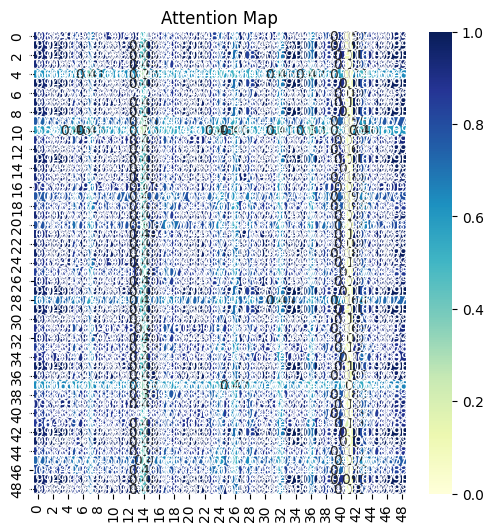

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])

Accuracy: tensor(0.8562)

tensor(424.2603, grad_fn=<DivBackward1>)


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2
  3%|▎         | 1/30 [09:37<4:39:13, 577.72s/it]

Complete 0 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9304, 0.9998, 0.9696,  ..., 0.9730, 0.9897, 0.9771],
         [0.9965, 0.9623, 0.9989,  ..., 0.9980, 0.9884, 0.9967],
         [0.9944, 0.9682, 0.9997,  ..., 0.9992, 0.9916, 0.9983],
         ...,
         [0.9713, 0.8344, 0.9330,  ..., 0.9278, 0.8924, 0.9210],
         [0.9903, 0.9760, 1.0000,  ..., 1.0000, 0.9954, 0.9997],
         [0.9744, 0.9912, 0.9954,  ..., 0.9967, 1.0000, 0.9980]],

        [[0.9481, 0.9996, 0.9829,  ..., 0.9496, 0.9959, 0.9870],
         [0.9842, 0.9847, 0.9993,  ..., 0.9851, 0.9983, 0.9999],
         [0.9869, 0.9818, 0.9998,  ..., 0.9877, 0.9973, 1.0000],
         ...,
         [0.8471, 0.9757, 0.9097,  ..., 0.8496, 0.9439, 0.9188],
         [0.9890, 0.9791, 1.0000,  ..., 0.9897, 0.9962, 0.9999],
         [0.9991, 0.9522, 0.9950,  ..., 0.9993, 0.9812, 0.9924]],

        [[0.9939, 0.9997, 0.9719,  ..., 0.9702, 0.9897, 0.9827],
         [0.9829, 0.9640, 0.9983,  ..., 0.9987, 0.9884, 0.9940],
         [0.9944, 0.9818, 0.9998,  ..., 0.9996, 0.9

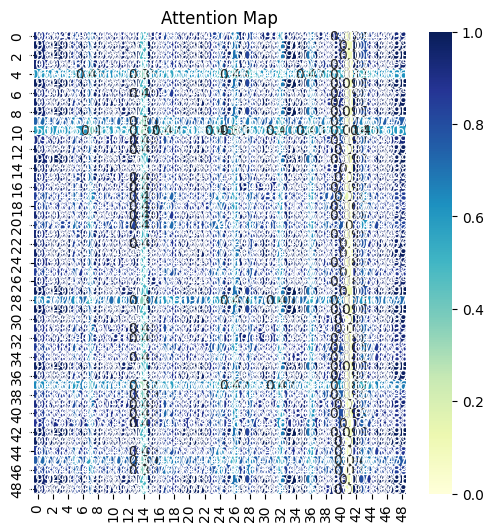

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.9375)

tensor(417.5220, grad_fn=<DivBackward1>)


  7%|▋         | 2/30 [20:15<4:46:13, 613.32s/it]

Complete 1 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9979, 0.9131, 0.9809,  ..., 0.9819, 0.9588, 0.9866],
         [0.9837, 0.9840, 0.9987,  ..., 0.9985, 0.9991, 0.9966],
         [0.9899, 0.9764, 0.9999,  ..., 0.9999, 0.9966, 0.9990],
         ...,
         [0.9033, 0.9960, 0.9501,  ..., 0.9486, 0.9748, 0.9400],
         [0.9900, 0.9763, 0.9999,  ..., 0.9999, 0.9966, 0.9991],
         [0.9749, 0.9908, 0.9955,  ..., 0.9950, 1.0000, 0.9920]],

        [[0.9339, 1.0000, 0.9724,  ..., 0.9973, 0.9895, 0.9823],
         [0.9973, 0.9597, 0.9983,  ..., 0.9756, 0.9887, 0.9943],
         [0.9952, 0.9660, 0.9994,  ..., 0.9805, 0.9920, 0.9965],
         ...,
         [0.8653, 0.9844, 0.9213,  ..., 0.9712, 0.9520, 0.9383],
         [0.9900, 0.9763, 1.0000,  ..., 0.9881, 0.9966, 0.9992],
         [0.9749, 0.9908, 0.9958,  ..., 0.9975, 1.0000, 0.9990]],

        [[0.9935, 1.0000, 0.9698,  ..., 0.9716, 0.9436, 0.9640],
         [0.9967, 0.9826, 0.9987,  ..., 0.9990, 0.9896, 0.9972],
         [0.9899, 0.9697, 1.0000,  ..., 0.9999, 0.9

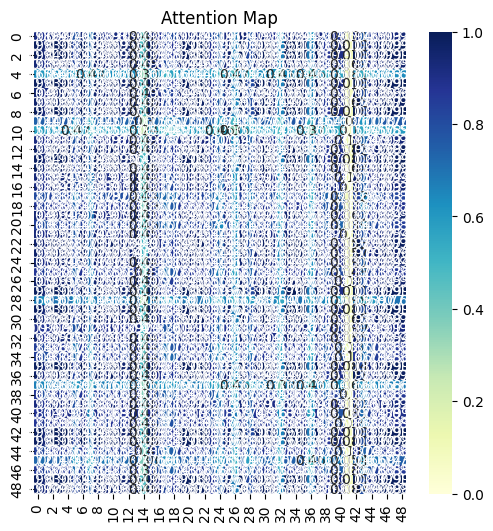

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.9375)

tensor(412.9293, grad_fn=<DivBackward1>)


 10%|█         | 3/30 [31:40<4:50:40, 645.96s/it]

Complete 2 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9388, 0.9004, 0.9742,  ..., 0.9701, 0.9912, 0.9834],
         [0.9840, 0.9610, 0.9986,  ..., 0.9975, 0.9991, 1.0000],
         [0.9886, 0.9683, 0.9997,  ..., 0.9991, 0.9975, 0.9998],
         ...,
         [0.8923, 0.8452, 0.9404,  ..., 0.9344, 0.9680, 0.9545],
         [0.9944, 0.9786, 0.9998,  ..., 1.0000, 0.9932, 0.9978],
         [0.9996, 0.9915, 0.9951,  ..., 0.9967, 0.9813, 0.9897]],

        [[0.9388, 1.0000, 0.9721,  ..., 0.9981, 0.9469, 0.9789],
         [0.9854, 0.9847, 0.9985,  ..., 0.9926, 0.9893, 0.9997],
         [0.9957, 0.9683, 0.9997,  ..., 0.9802, 0.9977, 0.9984],
         ...,
         [0.9187, 0.9979, 0.9576,  ..., 0.9930, 0.9280, 0.9661],
         [0.9944, 0.9713, 0.9999,  ..., 0.9826, 0.9968, 0.9991],
         [0.9769, 0.9915, 0.9951,  ..., 0.9970, 0.9819, 0.9977]],

        [[0.9939, 0.8972, 0.9742,  ..., 0.9761, 0.9908, 0.9667],
         [0.9854, 0.9834, 0.9985,  ..., 0.9980, 0.9893, 0.9997],
         [0.9886, 0.9795, 0.9994,  ..., 0.9991, 0.9

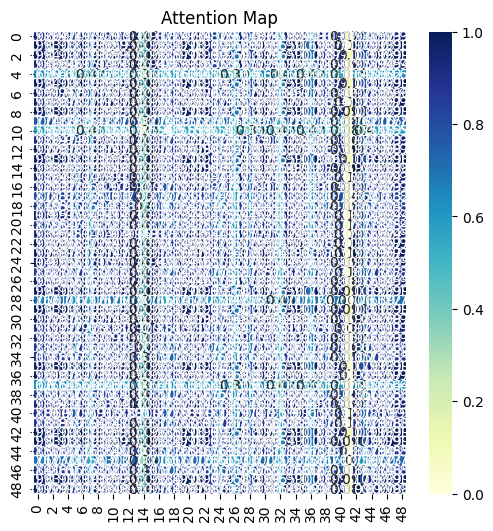

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.9688)

tensor(409.3363, grad_fn=<DivBackward1>)


 13%|█▎        | 4/30 [43:20<4:49:04, 667.09s/it]

Complete 3 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9941, 1.0000, 0.9736,  ..., 0.9761, 0.9507, 0.9686],
         [0.9848, 0.9614, 0.9986,  ..., 0.9980, 0.9994, 0.9995],
         [0.9950, 0.9790, 0.9997,  ..., 0.9999, 0.9940, 0.9990],
         ...,
         [0.9725, 0.9916, 0.9377,  ..., 0.9414, 0.9055, 0.9303],
         [0.9910, 0.9716, 0.9999,  ..., 0.9997, 0.9972, 0.9999],
         [0.9998, 0.9920, 0.9948,  ..., 0.9959, 0.9823, 0.9924]],

        [[0.9941, 1.0000, 0.9765,  ..., 0.8900, 0.9488, 0.9810],
         [0.9862, 0.9616, 0.9984,  ..., 0.9787, 0.9988, 0.9968],
         [0.9964, 0.9806, 0.9997,  ..., 0.9589, 0.9915, 1.0000],
         ...,
         [0.8979, 0.8467, 0.9391,  ..., 0.9960, 0.9696, 0.9314],
         [0.9953, 0.9782, 0.9999,  ..., 0.9623, 0.9930, 0.9999],
         [0.9999, 0.9920, 0.9954,  ..., 0.9371, 0.9798, 0.9973]],

        [[0.9942, 1.0000, 0.9739,  ..., 0.9761, 0.9915, 0.9686],
         [0.9984, 0.9857, 0.9979,  ..., 0.9985, 0.9994, 0.9962],
         [0.9893, 0.9669, 0.9997,  ..., 0.9994, 0.9

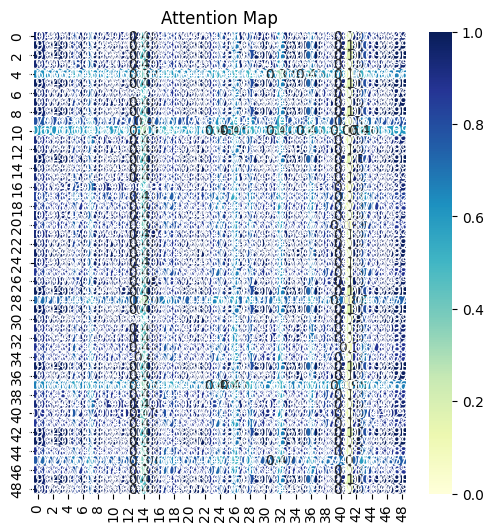

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.9812)

tensor(406.6995, grad_fn=<DivBackward1>)


 17%|█▋        | 5/30 [56:26<4:55:50, 710.03s/it]

Complete 4 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9490, 1.0000, 0.9786,  ..., 0.9800, 0.9546, 0.9707],
         [0.9868, 0.9858, 0.9989,  ..., 0.9992, 0.9896, 0.9965],
         [0.9970, 0.9681, 0.9993,  ..., 0.9990, 0.9983, 1.0000],
         ...,
         [0.8981, 0.9914, 0.9412,  ..., 0.9434, 0.9057, 0.9289],
         [0.9927, 0.9779, 1.0000,  ..., 1.0000, 0.9948, 0.9992],
         [0.9783, 0.9925, 0.9956,  ..., 0.9962, 0.9819, 0.9916]],

        [[0.9489, 1.0000, 0.9786,  ..., 0.9965, 0.9546, 0.9830],
         [0.9868, 0.9868, 0.9989,  ..., 0.9706, 0.9896, 0.9997],
         [0.9901, 0.9830, 0.9997,  ..., 0.9650, 0.9926, 1.0000],
         ...,
         [0.7917, 0.9382, 0.8512,  ..., 0.9627, 0.8018, 0.8621],
         [0.9953, 0.9741, 0.9998,  ..., 0.9530, 0.9969, 0.9992],
         [0.9999, 0.9530, 0.9950,  ..., 0.9262, 1.0000, 0.9925]],

        [[0.9490, 1.0000, 0.9757,  ..., 0.9800, 0.9923, 0.9830],
         [0.9856, 0.9880, 0.9976,  ..., 0.9988, 0.9996, 0.9995],
         [0.9902, 0.9830, 0.9992,  ..., 0.9998, 0.9

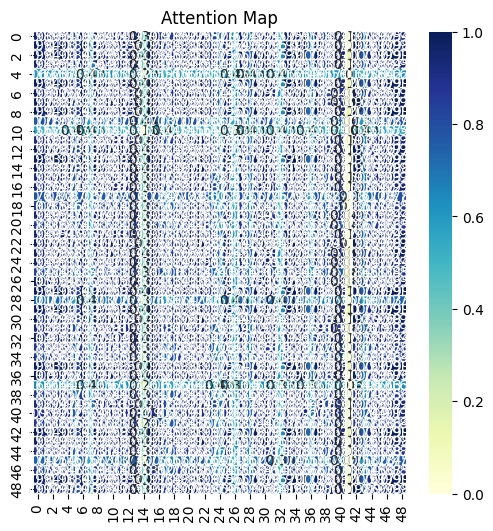

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.9875)

tensor(404.5934, grad_fn=<DivBackward1>)


 20%|██        | 6/30 [1:09:28<4:53:44, 734.36s/it]

Complete 5 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9946, 0.9999, 0.9806,  ..., 0.9781, 0.9942, 0.9727],
         [0.9990, 0.9873, 0.9988,  ..., 0.9981, 0.9992, 0.9963],
         [0.9964, 0.9803, 1.0000,  ..., 0.9998, 0.9967, 0.9989],
         ...,
         [0.9680, 0.9902, 0.9408,  ..., 0.9367, 0.9670, 0.9280],
         [0.9968, 0.9811, 0.9999,  ..., 0.9997, 0.9971, 0.9987],
         [0.9803, 0.9518, 0.9945,  ..., 0.9957, 0.9810, 0.9977]],

        [[0.9976, 0.9987, 0.9866,  ..., 0.8332, 0.9665, 0.9800],
         [0.9990, 0.9865, 0.9988,  ..., 0.8870, 0.9893, 0.9963],
         [0.9964, 0.9793, 0.9999,  ..., 0.9036, 0.9943, 0.9989],
         ...,
         [0.9985, 0.9848, 0.9992,  ..., 0.8913, 0.9907, 0.9971],
         [0.9935, 0.9730, 0.9998,  ..., 0.9152, 0.9970, 0.9998],
         [0.9803, 0.9502, 0.9945,  ..., 0.9453, 1.0000, 0.9977]],

        [[0.9946, 0.9125, 0.9805,  ..., 0.9799, 0.9942, 0.9727],
         [0.9993, 0.9598, 0.9984,  ..., 0.9982, 0.9994, 0.9956],
         [0.9964, 0.9717, 0.9999,  ..., 0.9999, 0.9

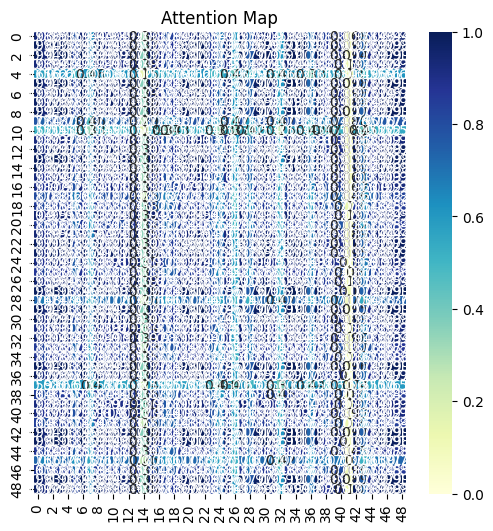

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.9875)

tensor(403.2481, grad_fn=<DivBackward1>)


 23%|██▎       | 7/30 [1:22:49<4:49:58, 756.46s/it]

Complete 6 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9663, 0.9284, 0.9874,  ..., 0.9869, 0.9970, 0.9903],
         [0.9994, 0.9876, 0.9977,  ..., 0.9979, 0.9888, 0.9962],
         [0.9971, 0.9801, 0.9997,  ..., 0.9997, 0.9942, 0.9990],
         ...,
         [0.9764, 0.9955, 0.9497,  ..., 0.9506, 0.9220, 0.9435],
         [0.9932, 0.9715, 0.9999,  ..., 0.9999, 0.9977, 1.0000],
         [0.9834, 0.9542, 0.9968,  ..., 0.9965, 1.0000, 0.9982]],

        [[0.9946, 0.9998, 0.9818,  ..., 0.8848, 0.9565, 0.9704],
         [0.9994, 0.9876, 0.9986,  ..., 0.9386, 0.9874, 0.9944],
         [0.9981, 0.9830, 0.9997,  ..., 0.9474, 0.9913, 0.9969],
         ...,
         [0.9058, 0.8508, 0.9381,  ..., 0.9985, 0.9690, 0.9549],
         [0.9973, 0.9808, 0.9999,  ..., 0.9509, 0.9927, 0.9977],
         [1.0000, 0.9925, 0.9962,  ..., 0.9264, 0.9813, 0.9900]],

        [[0.9576, 0.9184, 0.9788,  ..., 0.9794, 0.9592, 0.9746],
         [0.9996, 0.9894, 0.9982,  ..., 0.9980, 0.9998, 0.9992],
         [0.9918, 0.9700, 0.9992,  ..., 0.9993, 0.9

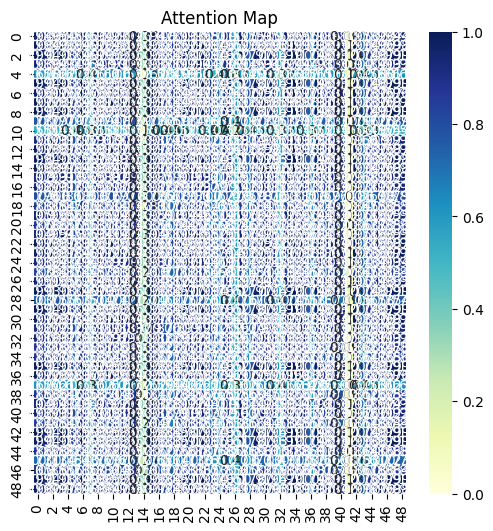

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.9875)

tensor(401.9921, grad_fn=<DivBackward1>)


 27%|██▋       | 8/30 [1:35:59<4:41:14, 767.02s/it]

Complete 7 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9600, 0.9999, 0.9797,  ..., 0.9821, 0.9942, 0.9721],
         [0.9996, 0.9638, 0.9985,  ..., 0.9978, 0.9891, 0.9998],
         [0.9974, 0.9742, 0.9999,  ..., 0.9997, 0.9944, 0.9997],
         ...,
         [0.9029, 0.9886, 0.9342,  ..., 0.9385, 0.9630, 0.9214],
         [0.9976, 0.9736, 0.9999,  ..., 0.9996, 0.9942, 0.9998],
         [1.0000, 0.9546, 0.9962,  ..., 0.9950, 0.9837, 0.9987]],

        [[0.9948, 0.9218, 0.9828,  ..., 0.9859, 0.9942, 0.9763],
         [0.9997, 0.9620, 0.9981,  ..., 0.9990, 0.9999, 0.9956],
         [0.9974, 0.9742, 0.9999,  ..., 1.0000, 0.9978, 0.9990],
         ...,
         [0.8233, 0.9493, 0.8644,  ..., 0.8562, 0.8263, 0.8794],
         [0.9935, 0.9827, 0.9995,  ..., 0.9989, 0.9942, 1.0000],
         [0.9841, 0.9926, 0.9955,  ..., 0.9937, 0.9851, 0.9980]],

        [[0.9679, 0.9990, 0.9854,  ..., 0.9874, 0.9693, 0.9824],
         [0.9996, 0.9638, 0.9985,  ..., 0.9978, 0.9997, 0.9993],
         [0.9938, 0.9822, 0.9996,  ..., 0.9999, 0.9

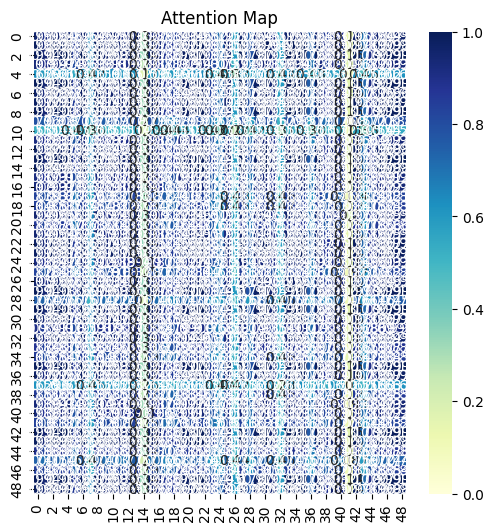

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(0.9875)

tensor(401.1847, grad_fn=<DivBackward1>)


 30%|███       | 9/30 [1:48:44<4:28:12, 766.31s/it]

Complete 8 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9947, 0.9999, 0.9805,  ..., 0.9813, 0.9634, 0.9859],
         [0.9877, 0.9631, 0.9981,  ..., 0.9978, 0.9999, 0.9958],
         [0.9987, 0.9860, 0.9990,  ..., 0.9992, 0.9930, 0.9999],
         ...,
         [0.9632, 0.9878, 0.9342,  ..., 0.9357, 0.9064, 0.9441],
         [0.9940, 0.9747, 0.9999,  ..., 0.9998, 0.9982, 0.9990],
         [1.0000, 0.9931, 0.9956,  ..., 0.9959, 0.9858, 0.9979]],

        [[0.9947, 0.9998, 0.9805,  ..., 0.9968, 0.9957, 0.9736],
         [0.9876, 0.9618, 0.9981,  ..., 0.9438, 0.9861, 0.9996],
         [0.9925, 0.9707, 0.9996,  ..., 0.9546, 0.9913, 1.0000],
         ...,
         [0.9999, 0.9910, 0.9966,  ..., 0.9811, 0.9997, 0.9933],
         [0.9979, 0.9829, 0.9995,  ..., 0.9701, 0.9973, 0.9979],
         [1.0000, 0.9925, 0.9956,  ..., 0.9833, 0.9999, 0.9919]],

        [[0.9623, 0.9999, 0.9805,  ..., 0.9841, 0.9943, 0.9736],
         [0.9886, 0.9903, 0.9974,  ..., 0.9986, 0.9998, 0.9944],
         [0.9925, 0.9860, 0.9990,  ..., 0.9997, 0.9

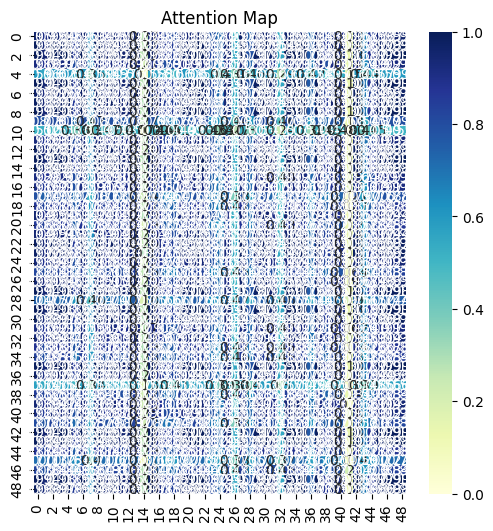

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(400.4677, grad_fn=<DivBackward1>)


 33%|███▎      | 10/30 [2:00:21<4:08:19, 744.97s/it]

Complete 9 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9644, 0.9998, 0.9812,  ..., 0.9837, 0.9653, 0.9894],
         [0.9888, 0.9906, 0.9972,  ..., 0.9981, 0.9894, 0.9997],
         [0.9980, 0.9753, 0.9999,  ..., 0.9997, 0.9982, 0.9982],
         ...,
         [0.9738, 0.8746, 0.9545,  ..., 0.9505, 0.9730, 0.9392],
         [0.9971, 0.9779, 1.0000,  ..., 0.9999, 0.9974, 0.9989],
         [1.0000, 0.9575, 0.9966,  ..., 0.9954, 0.9999, 0.9914]],

        [[0.9642, 0.9271, 0.9812,  ..., 0.8163, 0.9944, 0.9861],
         [0.9888, 0.9643, 0.9972,  ..., 0.8746, 0.9999, 0.9989],
         [0.9988, 0.9860, 0.9997,  ..., 0.9170, 0.9934, 0.9986],
         ...,
         [0.9102, 0.8582, 0.9377,  ..., 0.7256, 0.9644, 0.9467],
         [0.9982, 0.9840, 0.9999,  ..., 0.9125, 0.9946, 0.9991],
         [1.0000, 0.9937, 0.9966,  ..., 0.9371, 0.9854, 0.9940]],

        [[0.9644, 0.9998, 0.9813,  ..., 0.9837, 0.9958, 0.9794],
         [0.9998, 0.9632, 0.9984,  ..., 0.9975, 0.9874, 0.9989],
         [0.9988, 0.9709, 0.9996,  ..., 0.9992, 0.9

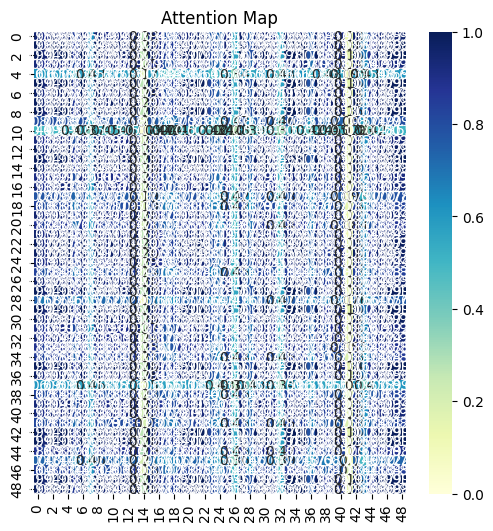

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(399.9309, grad_fn=<DivBackward1>)


 37%|███▋      | 11/30 [2:11:27<3:48:15, 720.81s/it]

Complete 10 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9950, 0.9277, 0.9853,  ..., 0.9854, 0.9668, 0.9806],
         [0.9890, 0.9904, 0.9971,  ..., 0.9970, 0.9999, 0.9987],
         [0.9930, 0.9859, 0.9989,  ..., 0.9989, 0.9992, 0.9998],
         ...,
         [0.9613, 0.8510, 0.9397,  ..., 0.9399, 0.9076, 0.9309],
         [0.9972, 0.9776, 1.0000,  ..., 1.0000, 0.9964, 0.9997],
         [0.9869, 0.9922, 0.9959,  ..., 0.9959, 1.0000, 0.9979]],

        [[0.9658, 0.9996, 0.9853,  ..., 0.9851, 0.9946, 0.9806],
         [1.0000, 0.9611, 0.9966,  ..., 0.9124, 0.9888, 0.9984],
         [0.9982, 0.9739, 0.9995,  ..., 0.9316, 0.9951, 1.0000],
         ...,
         [1.0000, 0.9610, 0.9966,  ..., 0.9122, 0.9887, 0.9984],
         [0.9944, 0.9831, 0.9999,  ..., 0.9466, 0.9986, 0.9992],
         [1.0000, 0.9589, 0.9959,  ..., 0.9093, 0.9875, 0.9979]],

        [[0.9949, 0.9996, 0.9853,  ..., 0.9828, 0.9961, 0.9896],
         [0.9882, 0.9611, 0.9966,  ..., 0.9977, 0.9864, 0.9939],
         [0.9990, 0.9853, 0.9996,  ..., 0.9991, 0.9

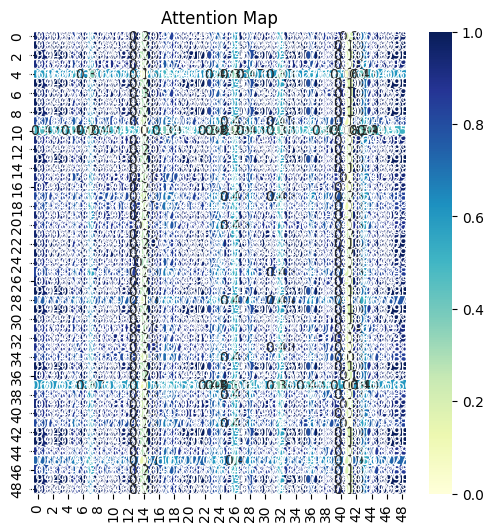

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(399.4760, grad_fn=<DivBackward1>)


 40%|████      | 12/30 [2:23:20<3:35:34, 718.57s/it]

Complete 11 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9734, 0.9349, 0.9896,  ..., 0.9887, 0.9693, 0.9818],
         [1.0000, 0.9903, 0.9966,  ..., 0.9971, 0.9998, 0.9994],
         [0.9985, 0.9821, 0.9995,  ..., 0.9997, 0.9974, 0.9999],
         ...,
         [0.9252, 0.8694, 0.9541,  ..., 0.9523, 0.9188, 0.9394],
         [0.9986, 0.9825, 0.9994,  ..., 0.9996, 0.9975, 0.9999],
         [0.9865, 0.9560, 0.9970,  ..., 0.9965, 0.9835, 0.9923]],

        [[0.9732, 0.9349, 0.9896,  ..., 0.9923, 0.9969, 0.9901],
         [1.0000, 0.9903, 0.9966,  ..., 0.9947, 0.9890, 0.9963],
         [0.9933, 0.9691, 0.9996,  ..., 1.0000, 0.9993, 0.9997],
         ...,
         [0.9515, 0.9040, 0.9746,  ..., 0.9789, 0.9872, 0.9754],
         [0.9963, 0.9761, 1.0000,  ..., 0.9997, 0.9976, 1.0000],
         [1.0000, 0.9912, 0.9960,  ..., 0.9940, 0.9880, 0.9957]],

        [[0.9732, 0.9349, 0.9896,  ..., 0.9887, 0.9982, 0.9859],
         [0.9896, 0.9619, 0.9984,  ..., 0.9981, 0.9996, 0.9968],
         [0.9933, 0.9691, 0.9996,  ..., 0.9994, 0.9

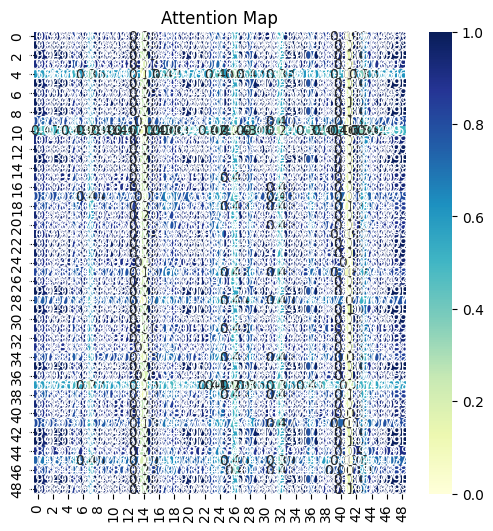

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(399.1239, grad_fn=<DivBackward1>)


 43%|████▎     | 13/30 [2:34:57<3:21:42, 711.90s/it]

Complete 12 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9689, 0.9259, 0.9861,  ..., 0.9851, 0.9628, 0.9774],
         [1.0000, 0.9899, 0.9966,  ..., 0.9970, 0.9997, 0.9993],
         [0.9954, 0.9721, 0.9999,  ..., 0.9998, 0.9928, 0.9983],
         ...,
         [0.9073, 0.8441, 0.9382,  ..., 0.9363, 0.8975, 0.9218],
         [0.9988, 0.9820, 0.9994,  ..., 0.9996, 0.9973, 0.9999],
         [1.0000, 0.9904, 0.9963,  ..., 0.9968, 0.9998, 0.9992]],

        [[0.9947, 0.9992, 0.9826,  ..., 0.9997, 0.9951, 0.9863],
         [1.0000, 0.9888, 0.9970,  ..., 0.9963, 0.9999, 0.9984],
         [0.9987, 0.9812, 0.9995,  ..., 0.9915, 0.9985, 0.9999],
         ...,
         [0.9449, 0.9816, 0.9153,  ..., 0.9675, 0.9462, 0.9234],
         [0.9988, 0.9815, 0.9994,  ..., 0.9917, 0.9986, 0.9999],
         [1.0000, 0.9900, 0.9963,  ..., 0.9970, 1.0000, 0.9979]],

        [[0.9692, 0.9259, 0.9826,  ..., 0.9860, 0.9628, 0.9823],
         [0.9902, 0.9610, 0.9970,  ..., 0.9984, 0.9865, 0.9969],
         [0.9954, 0.9721, 0.9995,  ..., 0.9999, 0.9

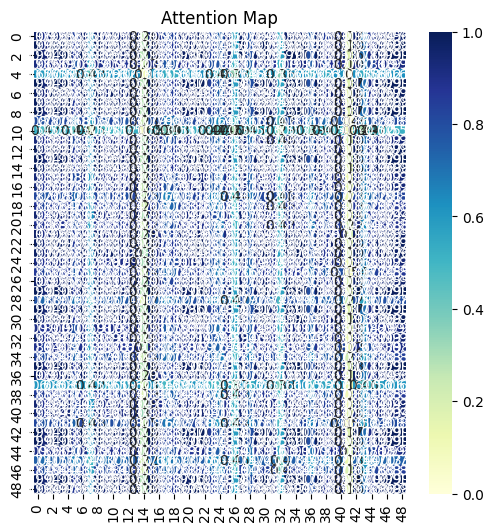

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(398.7807, grad_fn=<DivBackward1>)


 47%|████▋     | 14/30 [2:46:22<3:07:37, 703.62s/it]

Complete 13 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9703, 0.9245, 0.9865,  ..., 0.9831, 0.9625, 0.9832],
         [0.9905, 0.9592, 0.9984,  ..., 0.9971, 0.9859, 0.9971],
         [0.9989, 0.9807, 0.9994,  ..., 0.9999, 0.9970, 0.9999],
         ...,
         [0.9561, 0.9889, 0.9302,  ..., 0.9369, 0.9644, 0.9369],
         [0.9989, 0.9807, 0.9994,  ..., 0.9999, 0.9970, 0.9999],
         [0.9883, 0.9548, 0.9974,  ..., 0.9957, 0.9832, 0.9958]],

        [[0.9700, 0.9989, 0.9830,  ..., 0.9998, 0.9679, 0.9863],
         [1.0000, 0.9592, 0.9984,  ..., 0.9754, 0.9999, 0.9971],
         [0.9988, 0.9705, 0.9999,  ..., 0.9840, 0.9984, 0.9995],
         ...,
         [0.8081, 0.9373, 0.8397,  ..., 0.9136, 0.8036, 0.8492],
         [0.9989, 0.9704, 0.9999,  ..., 0.9840, 0.9984, 0.9995],
         [1.0000, 0.9576, 0.9980,  ..., 0.9741, 1.0000, 0.9966]],

        [[0.9947, 0.9988, 0.9831,  ..., 0.9840, 0.9973, 0.9863],
         [1.0000, 0.9879, 0.9970,  ..., 0.9974, 0.9994, 0.9983],
         [0.9955, 0.9699, 0.9999,  ..., 0.9998, 0.9

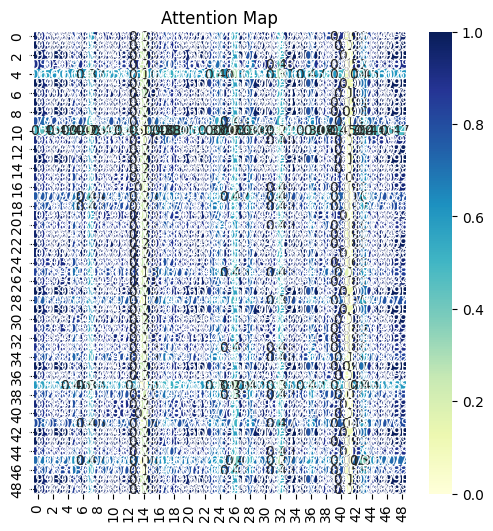

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(398.5081, grad_fn=<DivBackward1>)


 50%|█████     | 15/30 [2:57:43<2:54:13, 696.91s/it]

Complete 14 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9756, 0.9300, 0.9899,  ..., 0.9899, 0.9731, 0.9896],
         [1.0000, 0.9868, 0.9971,  ..., 0.9971, 0.9999, 0.9973],
         [0.9996, 0.9828, 0.9986,  ..., 0.9986, 0.9993, 0.9987],
         ...,
         [0.9066, 0.8345, 0.9363,  ..., 0.9362, 0.9021, 0.9355],
         [0.9956, 0.9686, 0.9999,  ..., 0.9999, 0.9945, 0.9999],
         [0.9900, 0.9558, 0.9981,  ..., 0.9981, 0.9883, 0.9979]],

        [[0.9947, 0.9985, 0.9835,  ..., 0.9956, 0.9681, 0.9839],
         [1.0000, 0.9880, 0.9967,  ..., 1.0000, 0.9883, 0.9969],
         [0.9955, 0.9686, 0.9999,  ..., 0.9946, 0.9984, 0.9998],
         ...,
         [0.8903, 0.8148, 0.9219,  ..., 0.8861, 0.9467, 0.9211],
         [0.9957, 0.9690, 0.9999,  ..., 0.9948, 0.9983, 0.9999],
         [0.9901, 0.9563, 0.9981,  ..., 0.9887, 0.9999, 0.9979]],

        [[0.9948, 0.9985, 0.9835,  ..., 0.9859, 0.9976, 0.9864],
         [0.9907, 0.9577, 0.9984,  ..., 0.9975, 0.9858, 0.9973],
         [0.9954, 0.9686, 0.9999,  ..., 0.9996, 0.9

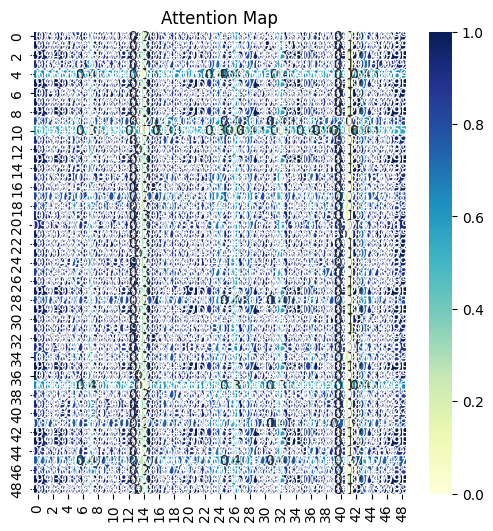

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(398.2615, grad_fn=<DivBackward1>)


 53%|█████▎    | 16/30 [3:08:30<2:39:07, 681.95s/it]

Complete 15 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9947, 0.9221, 0.9836,  ..., 0.9867, 0.9626, 0.9787],
         [0.9909, 0.9865, 0.9984,  ..., 0.9973, 0.9993, 0.9995],
         [0.9954, 0.9794, 0.9999,  ..., 0.9994, 0.9970, 1.0000],
         ...,
         [0.9067, 0.9899, 0.9360,  ..., 0.9297, 0.9644, 0.9445],
         [0.9957, 0.9787, 0.9999,  ..., 0.9995, 0.9967, 0.9999],
         [0.9999, 0.9527, 0.9959,  ..., 0.9974, 0.9831, 0.9933]],

        [[0.9712, 0.9984, 0.9868,  ..., 0.9776, 0.9959, 0.9787],
         [1.0000, 0.9576, 0.9972,  ..., 0.9997, 0.9892, 0.9995],
         [0.9935, 0.9832, 0.9994,  ..., 0.9964, 0.9993, 0.9968],
         ...,
         [0.9924, 0.9848, 0.9990,  ..., 0.9956, 0.9996, 0.9961],
         [0.9989, 0.9688, 0.9995,  ..., 0.9998, 0.9945, 0.9999],
         [0.9887, 0.9891, 0.9974,  ..., 0.9927, 1.0000, 0.9933]],

        [[0.9712, 0.9983, 0.9868,  ..., 0.9860, 0.9626, 0.9862],
         [1.0000, 0.9572, 0.9972,  ..., 0.9976, 0.9993, 0.9975],
         [0.9954, 0.9794, 0.9998,  ..., 0.9998, 0.9

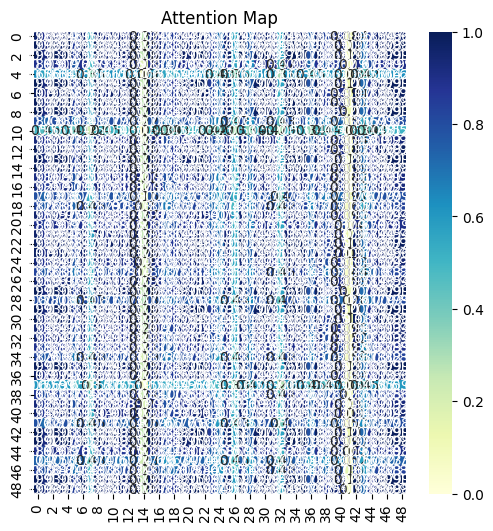

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(398.0753, grad_fn=<DivBackward1>)


 57%|█████▋    | 17/30 [3:19:07<2:24:48, 668.33s/it]

Complete 16 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9713, 0.9219, 0.9837,  ..., 0.9845, 0.9959, 0.9846],
         [1.0000, 0.9863, 0.9985,  ..., 0.9982, 0.9893, 0.9982],
         [0.9954, 0.9672, 0.9993,  ..., 0.9995, 0.9985, 0.9995],
         ...,
         [0.9671, 0.9954, 0.9505,  ..., 0.9491, 0.9196, 0.9490],
         [0.9971, 0.9721, 0.9999,  ..., 0.9999, 0.9972, 0.9999],
         [1.0000, 0.9873, 0.9981,  ..., 0.9978, 0.9884, 0.9977]],

        [[0.9755, 0.9289, 0.9896,  ..., 0.9939, 0.9672, 0.9878],
         [1.0000, 0.9863, 0.9973,  ..., 0.9943, 0.9992, 0.9982],
         [0.9991, 0.9795, 0.9993,  ..., 0.9976, 0.9970, 0.9997],
         ...,
         [1.0000, 0.9874, 0.9968,  ..., 0.9935, 0.9994, 0.9977],
         [0.9958, 0.9685, 0.9999,  ..., 0.9998, 0.9919, 0.9997],
         [1.0000, 0.9873, 0.9968,  ..., 0.9936, 0.9994, 0.9977]],

        [[0.9947, 0.9983, 0.9836,  ..., 0.9866, 0.9977, 0.9858],
         [0.9910, 0.9573, 0.9985,  ..., 0.9974, 0.9857, 0.9977],
         [0.9953, 0.9672, 0.9998,  ..., 0.9994, 0.9

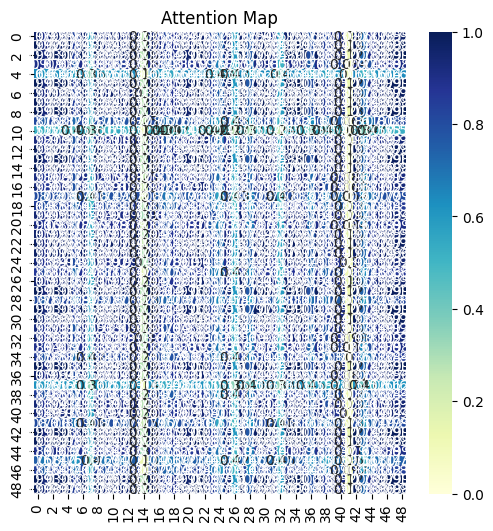

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.9319, grad_fn=<DivBackward1>)


 60%|██████    | 18/30 [3:29:45<2:11:51, 659.27s/it]

Complete 17 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9964, 0.9286, 0.9897,  ..., 0.9895, 0.9975, 0.9880],
         [1.0000, 0.9570, 0.9985,  ..., 0.9984, 0.9998, 0.9977],
         [0.9998, 0.9621, 0.9993,  ..., 0.9993, 0.9993, 0.9988],
         ...,
         [0.9065, 0.9898, 0.9288,  ..., 0.9293, 0.9004, 0.9329],
         [0.9989, 0.9685, 0.9999,  ..., 0.9999, 0.9981, 0.9997],
         [0.9889, 0.9888, 0.9959,  ..., 0.9960, 0.9866, 0.9969]],

        [[0.9946, 0.9214, 0.9837,  ..., 0.8364, 0.9980, 0.9849],
         [0.9905, 0.9869, 0.9981,  ..., 0.9387, 0.9842, 0.9977],
         [0.9992, 0.9668, 0.9993,  ..., 0.9024, 0.9968, 0.9996],
         ...,
         [0.9419, 0.8113, 0.9143,  ..., 0.7028, 0.9543, 0.9170],
         [0.9989, 0.9683, 0.9995,  ..., 0.9049, 0.9962, 0.9997],
         [0.9999, 0.9519, 0.9959,  ..., 0.8794, 0.9996, 0.9965]],

        [[0.9755, 0.9286, 0.9869,  ..., 0.9870, 0.9990, 0.9931],
         [1.0000, 0.9862, 0.9984,  ..., 0.9984, 0.9851, 0.9949],
         [0.9953, 0.9670, 0.9993,  ..., 0.9994, 0.9

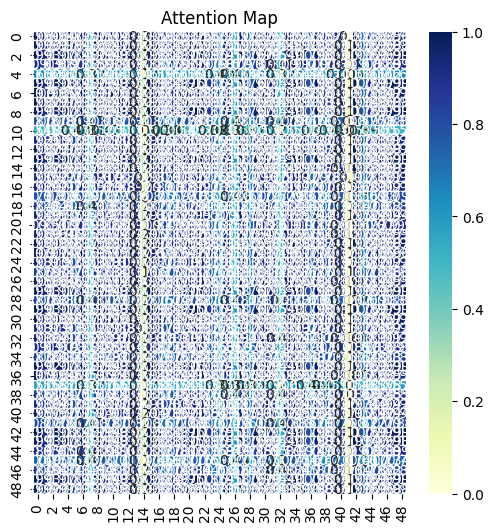

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.8028, grad_fn=<DivBackward1>)


 63%|██████▎   | 19/30 [3:41:09<2:02:14, 666.74s/it]

Complete 18 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9963, 0.9969, 0.9895,  ..., 0.9869, 0.9976, 0.9930],
         [1.0000, 0.9867, 0.9982,  ..., 0.9970, 0.9999, 0.9994],
         [0.9998, 0.9827, 0.9993,  ..., 0.9985, 0.9993, 0.9999],
         ...,
         [0.9664, 0.9954, 0.9498,  ..., 0.9446, 0.9704, 0.9577],
         [0.9989, 0.9776, 0.9999,  ..., 0.9996, 0.9979, 0.9999],
         [0.9999, 0.9886, 0.9974,  ..., 0.9960, 1.0000, 0.9989]],

        [[0.9758, 0.9969, 0.9868,  ..., 0.8911, 0.9976, 0.9881],
         [0.9907, 0.9867, 0.9969,  ..., 0.9246, 0.9999, 0.9976],
         [0.9992, 0.9666, 0.9998,  ..., 0.9563, 0.9937, 0.9996],
         ...,
         [0.9880, 0.9895, 0.9953,  ..., 0.9179, 1.0000, 0.9961],
         [0.9962, 0.9776, 0.9996,  ..., 0.9417, 0.9979, 0.9998],
         [0.9890, 0.9886, 0.9959,  ..., 0.9203, 1.0000, 0.9967]],

        [[0.9758, 0.9277, 0.9868,  ..., 0.9888, 0.9718, 0.9930],
         [0.9913, 0.9565, 0.9973,  ..., 0.9981, 0.9888, 0.9996],
         [0.9992, 0.9790, 0.9998,  ..., 0.9995, 0.9

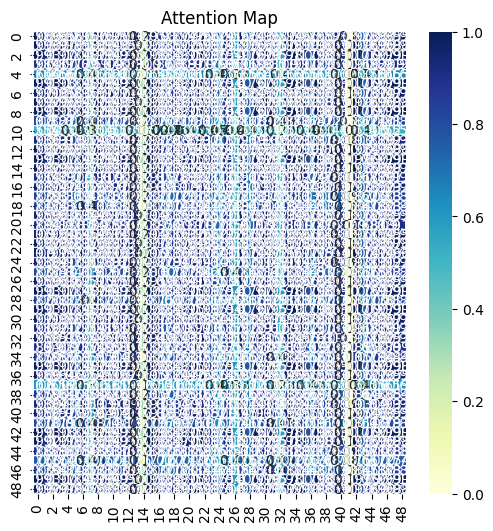

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.6717, grad_fn=<DivBackward1>)


 67%|██████▋   | 20/30 [3:52:46<1:52:39, 675.94s/it]

Complete 19 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9716, 0.9212, 0.9836,  ..., 0.9845, 0.9597, 0.9785],
         [0.9905, 0.9552, 0.9968,  ..., 0.9972, 0.9831, 0.9944],
         [0.9998, 0.9829, 0.9993,  ..., 0.9991, 0.9977, 0.9999],
         ...,
         [0.9072, 0.8320, 0.9292,  ..., 0.9311, 0.8876, 0.9195],
         [0.9989, 0.9777, 0.9999,  ..., 0.9999, 0.9956, 0.9999],
         [1.0000, 0.9869, 0.9981,  ..., 0.9978, 0.9990, 0.9994]],

        [[0.9716, 0.9211, 0.9836,  ..., 0.9039, 0.9983, 0.9852],
         [0.9912, 0.9564, 0.9972,  ..., 0.9431, 0.9988, 0.9979],
         [0.9992, 0.9791, 0.9998,  ..., 0.9694, 0.9901, 0.9996],
         ...,
         [0.9977, 0.9733, 1.0000,  ..., 0.9624, 0.9936, 1.0000],
         [0.9962, 0.9686, 0.9996,  ..., 0.9570, 0.9956, 0.9998],
         [1.0000, 0.9869, 0.9981,  ..., 0.9789, 0.9832, 0.9975]],

        [[0.9943, 0.9982, 0.9866,  ..., 0.9838, 0.9983, 0.9851],
         [1.0000, 0.9863, 0.9984,  ..., 0.9973, 0.9988, 0.9978],
         [0.9956, 0.9669, 0.9993,  ..., 0.9998, 0.9

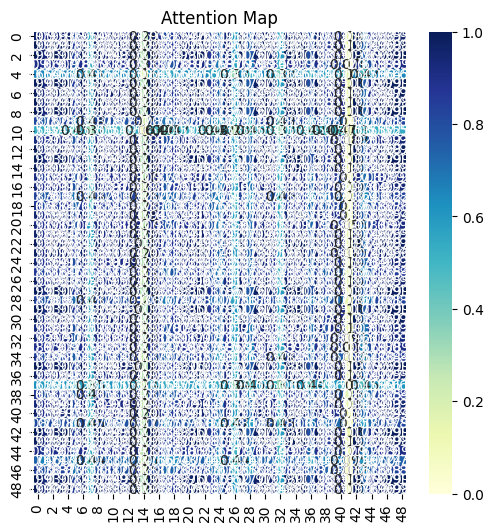

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.5692, grad_fn=<DivBackward1>)


 70%|███████   | 21/30 [4:04:49<1:43:28, 689.78s/it]

Complete 20 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9755, 0.9275, 0.9862,  ..., 0.9872, 0.9975, 0.9876],
         [1.0000, 0.9873, 0.9981,  ..., 0.9977, 0.9876, 0.9976],
         [0.9937, 0.9621, 0.9984,  ..., 0.9987, 0.9992, 0.9988],
         ...,
         [0.9658, 0.9951, 0.9501,  ..., 0.9482, 0.9169, 0.9475],
         [0.9964, 0.9691, 0.9996,  ..., 0.9997, 0.9977, 0.9998],
         [0.9909, 0.9558, 0.9969,  ..., 0.9973, 0.9999, 0.9975]],

        [[0.9940, 0.9213, 0.9833,  ..., 0.9993, 0.9588, 0.9784],
         [1.0000, 0.9568, 0.9971,  ..., 0.9894, 0.9835, 0.9949],
         [0.9938, 0.9832, 0.9993,  ..., 0.9670, 0.9976, 0.9999],
         ...,
         [0.9406, 0.8119, 0.9140,  ..., 0.9797, 0.8686, 0.9039],
         [0.9965, 0.9779, 0.9999,  ..., 0.9735, 0.9953, 0.9999],
         [0.9910, 0.9871, 0.9982,  ..., 0.9611, 0.9989, 0.9994]],

        [[0.9755, 0.9973, 0.9892,  ..., 0.9866, 0.9992, 0.9926],
         [0.9907, 0.9872, 0.9981,  ..., 0.9970, 0.9990, 0.9994],
         [0.9998, 0.9621, 0.9984,  ..., 0.9992, 0.9

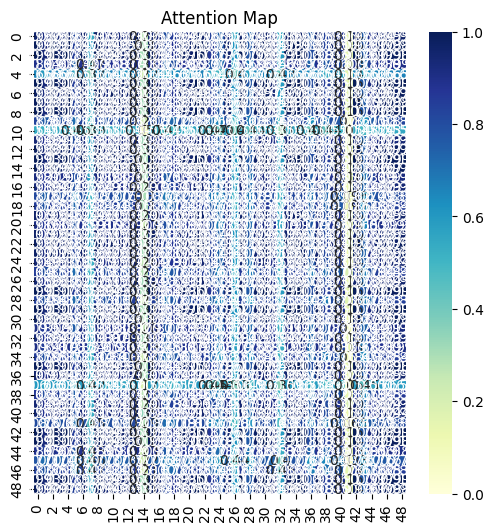

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.4833, grad_fn=<DivBackward1>)


 73%|███████▎  | 22/30 [4:17:10<1:34:02, 705.28s/it]

Complete 21 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9939, 0.9984, 0.9865,  ..., 0.9843, 0.9961, 0.9902],
         [1.0000, 0.9873, 0.9981,  ..., 0.9973, 0.9999, 0.9993],
         [0.9994, 0.9798, 0.9998,  ..., 0.9995, 0.9983, 1.0000],
         ...,
         [0.9252, 0.8544, 0.9439,  ..., 0.9478, 0.9167, 0.9356],
         [0.9965, 0.9693, 0.9996,  ..., 0.9999, 0.9944, 0.9986],
         [0.9913, 0.9563, 0.9970,  ..., 0.9979, 0.9880, 0.9947]],

        [[0.9722, 0.9212, 0.9832,  ..., 0.9964, 0.9961, 0.9845],
         [0.9917, 0.9569, 0.9971,  ..., 0.9997, 0.9998, 0.9977],
         [0.9999, 0.9835, 0.9993,  ..., 0.9906, 0.9910, 0.9989],
         ...,
         [0.9398, 0.9831, 0.9210,  ..., 0.8804, 0.8816, 0.9182],
         [0.9978, 0.9730, 0.9999,  ..., 0.9963, 0.9965, 1.0000],
         [1.0000, 0.9869, 0.9983,  ..., 0.9876, 0.9880, 0.9978]],

        [[0.9955, 0.9974, 0.9860,  ..., 0.9886, 0.9992, 0.9924],
         [1.0000, 0.9866, 0.9971,  ..., 0.9982, 0.9987, 0.9995],
         [0.9959, 0.9671, 0.9998,  ..., 0.9994, 0.9

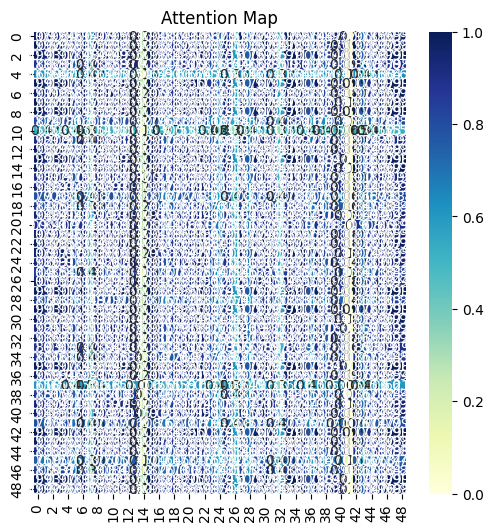

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.3922, grad_fn=<DivBackward1>)


 77%|███████▋  | 23/30 [4:28:05<1:20:30, 690.07s/it]

Complete 22 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9953, 0.9271, 0.9859,  ..., 0.9880, 0.9992, 0.9816],
         [1.0000, 0.9571, 0.9972,  ..., 0.9980, 0.9986, 0.9950],
         [0.9999, 0.9616, 0.9983,  ..., 0.9989, 0.9976, 0.9965],
         ...,
         [0.9641, 0.8537, 0.9434,  ..., 0.9474, 0.9776, 0.9352],
         [0.9983, 0.9732, 0.9999,  ..., 1.0000, 0.9933, 0.9993],
         [0.9918, 0.9867, 0.9984,  ..., 0.9975, 0.9829, 0.9995]],

        [[0.9936, 0.9984, 0.9832,  ..., 0.9965, 0.9985, 0.9844],
         [1.0000, 0.9865, 0.9972,  ..., 0.9997, 0.9986, 0.9977],
         [0.9999, 0.9837, 0.9983,  ..., 0.9991, 0.9976, 0.9986],
         ...,
         [0.9231, 0.8504, 0.9473,  ..., 0.9118, 0.9006, 0.9452],
         [0.9968, 0.9693, 1.0000,  ..., 0.9939, 0.9905, 0.9999],
         [0.9918, 0.9567, 0.9984,  ..., 0.9876, 0.9829, 0.9980]],

        [[0.9759, 0.9974, 0.9859,  ..., 0.9885, 0.9704, 0.9870],
         [1.0000, 0.9572, 0.9985,  ..., 0.9974, 0.9998, 0.9981],
         [0.9938, 0.9837, 0.9983,  ..., 0.9991, 0.9

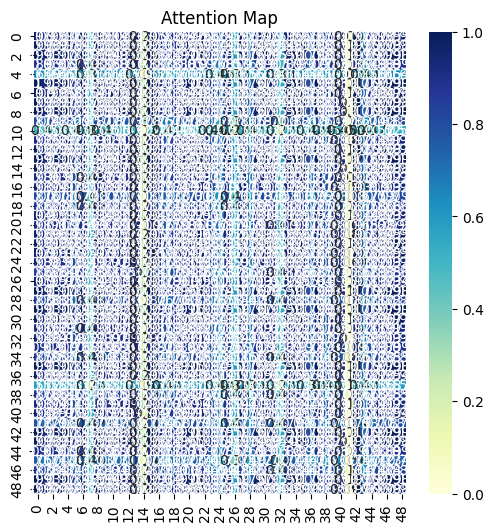

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.3374, grad_fn=<DivBackward1>)


 80%|████████  | 24/30 [4:38:54<1:07:47, 677.86s/it]

Complete 23 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9950, 0.9271, 0.9857,  ..., 0.9863, 0.9974, 0.9881],
         [0.9917, 0.9872, 0.9983,  ..., 0.9980, 0.9878, 0.9973],
         [0.9996, 0.9669, 0.9992,  ..., 0.9993, 0.9984, 0.9997],
         ...,
         [0.9634, 0.8539, 0.9430,  ..., 0.9443, 0.9704, 0.9477],
         [0.9992, 0.9695, 0.9996,  ..., 0.9997, 0.9977, 0.9999],
         [0.9902, 0.9890, 0.9975,  ..., 0.9972, 0.9859, 0.9963]],

        [[0.9730, 0.9985, 0.9830,  ..., 0.8006, 0.9985, 0.9841],
         [1.0000, 0.9575, 0.9985,  ..., 0.9128, 0.9830, 0.9982],
         [0.9960, 0.9802, 0.9992,  ..., 0.8728, 0.9959, 0.9994],
         ...,
         [0.8930, 0.9827, 0.9129,  ..., 0.6619, 0.9571, 0.9153],
         [0.9992, 0.9695, 1.0000,  ..., 0.8942, 0.9903, 0.9999],
         [0.9998, 0.9528, 0.9975,  ..., 0.9191, 0.9799, 0.9970]],

        [[0.9761, 0.9271, 0.9890,  ..., 0.9878, 0.9974, 0.9921],
         [1.0000, 0.9865, 0.9972,  ..., 0.9977, 0.9885, 0.9952],
         [0.9999, 0.9840, 0.9982,  ..., 0.9986, 0.9

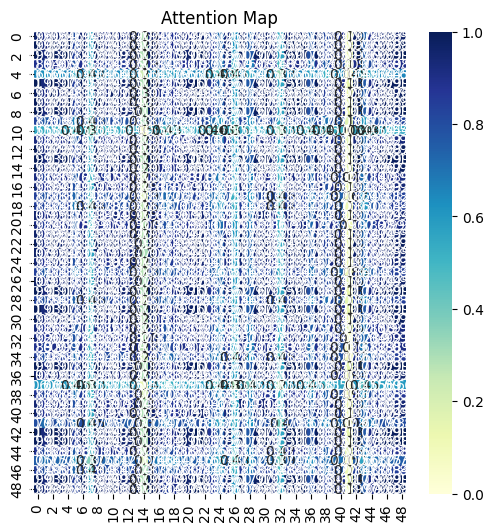

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.2664, grad_fn=<DivBackward1>)


 83%|████████▎ | 25/30 [4:49:36<55:35, 667.19s/it]  

Complete 24 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9733, 0.9984, 0.9830,  ..., 0.9839, 0.9664, 0.9788],
         [1.0000, 0.9576, 0.9986,  ..., 0.9983, 0.9997, 0.9995],
         [0.9940, 0.9842, 0.9980,  ..., 0.9983, 0.9904, 0.9965],
         ...,
         [0.9107, 0.9897, 0.9286,  ..., 0.9304, 0.8990, 0.9206],
         [0.9992, 0.9694, 1.0000,  ..., 0.9999, 0.9977, 0.9999],
         [0.9997, 0.9522, 0.9974,  ..., 0.9970, 1.0000, 0.9987]],

        [[0.9768, 0.9273, 0.9856,  ..., 0.9091, 0.9993, 0.9883],
         [0.9999, 0.9872, 0.9983,  ..., 0.9785, 0.9821, 0.9972],
         [1.0000, 0.9842, 0.9992,  ..., 0.9747, 0.9852, 0.9984],
         ...,
         [0.9375, 0.9826, 0.9210,  ..., 0.9903, 0.8652, 0.9147],
         [0.9970, 0.9695, 0.9995,  ..., 0.9569, 0.9948, 0.9999],
         [0.9921, 0.9566, 0.9968,  ..., 0.9420, 0.9986, 0.9980]],

        [[0.9933, 0.9218, 0.9868,  ..., 0.9854, 0.9963, 0.9901],
         [0.9920, 0.9872, 0.9968,  ..., 0.9974, 0.9878, 0.9948],
         [0.9996, 0.9667, 0.9998,  ..., 0.9996, 0.9

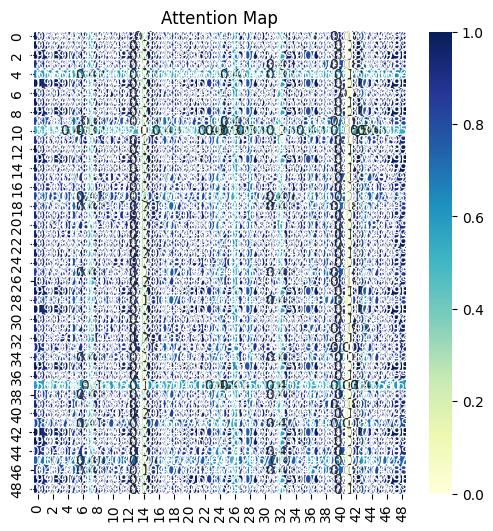

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.2080, grad_fn=<DivBackward1>)


 87%|████████▋ | 26/30 [5:00:07<43:45, 656.38s/it]

Complete 25 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9932, 0.9220, 0.9831,  ..., 0.9847, 0.9661, 0.9790],
         [0.9999, 0.9564, 0.9968,  ..., 0.9975, 0.9876, 0.9949],
         [0.9942, 0.9843, 0.9992,  ..., 0.9988, 0.9993, 0.9998],
         ...,
         [0.9507, 0.8333, 0.9284,  ..., 0.9316, 0.8982, 0.9207],
         [0.9971, 0.9781, 1.0000,  ..., 0.9999, 0.9976, 0.9999],
         [0.9999, 0.9562, 0.9967,  ..., 0.9974, 0.9874, 0.9948]],

        [[0.9773, 0.9974, 0.9857,  ..., 0.9371, 0.9993, 0.9865],
         [0.9928, 0.9863, 0.9971,  ..., 0.9018, 0.9983, 0.9975],
         [1.0000, 0.9609, 0.9992,  ..., 0.8496, 0.9849, 0.9990],
         ...,
         [0.9598, 0.8488, 0.9468,  ..., 0.6903, 0.8977, 0.9453],
         [0.9971, 0.9781, 0.9995,  ..., 0.8830, 0.9948, 0.9996],
         [0.9999, 0.9560, 0.9983,  ..., 0.8412, 0.9818, 0.9980]],

        [[0.9773, 0.9273, 0.9893,  ..., 0.9879, 0.9993, 0.9865],
         [0.9928, 0.9576, 0.9986,  ..., 0.9981, 0.9983, 0.9975],
         [0.9962, 0.9663, 0.9998,  ..., 0.9996, 0.9

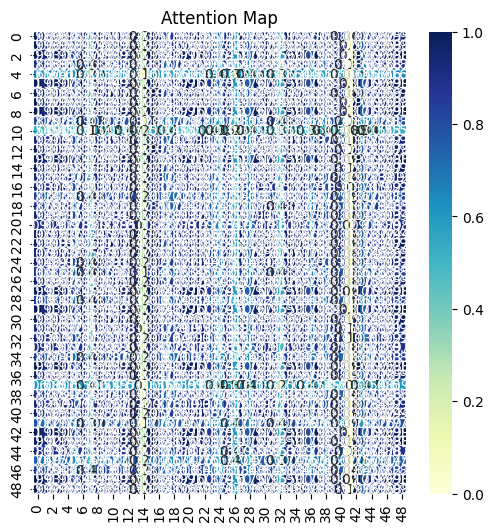

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.1549, grad_fn=<DivBackward1>)


 90%|█████████ | 27/30 [5:10:31<32:19, 646.66s/it]

Complete 26 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9743, 0.9217, 0.9872,  ..., 0.9848, 0.9655, 0.9866],
         [0.9924, 0.9562, 0.9984,  ..., 0.9975, 0.9872, 0.9982],
         [0.9942, 0.9605, 0.9992,  ..., 0.9985, 0.9895, 0.9990],
         ...,
         [0.9118, 0.8325, 0.9365,  ..., 0.9315, 0.8968, 0.9352],
         [0.9983, 0.9732, 1.0000,  ..., 1.0000, 0.9955, 1.0000],
         [0.9999, 0.9872, 0.9966,  ..., 0.9977, 0.9998, 0.9969]],

        [[0.9946, 0.9973, 0.9856,  ..., 0.9752, 0.9608, 0.9862],
         [1.0000, 0.9860, 0.9971,  ..., 0.9504, 0.9825, 0.9974],
         [0.9998, 0.9804, 0.9990,  ..., 0.9406, 0.9878, 0.9992],
         ...,
         [0.9457, 0.8774, 0.9648,  ..., 0.8031, 0.9880, 0.9638],
         [0.9994, 0.9779, 0.9995,  ..., 0.9366, 0.9896, 0.9996],
         [0.9999, 0.9871, 0.9966,  ..., 0.9525, 0.9812, 0.9969]],

        [[0.9743, 0.9217, 0.9831,  ..., 0.9848, 0.9655, 0.9792],
         [0.9924, 0.9562, 0.9968,  ..., 0.9975, 0.9872, 0.9949],
         [1.0000, 0.9842, 0.9992,  ..., 0.9987, 0.9

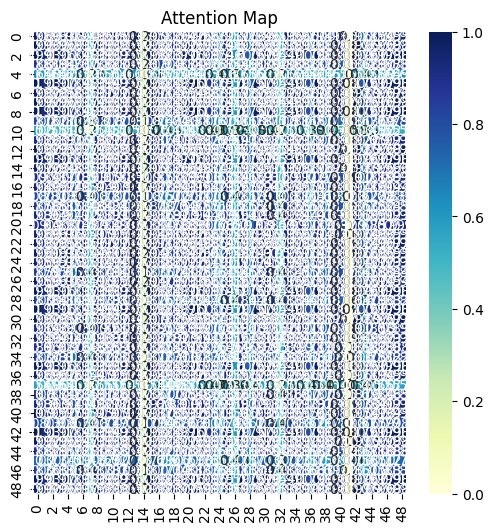

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.1093, grad_fn=<DivBackward1>)


 93%|█████████▎| 28/30 [5:21:01<21:23, 641.67s/it]

Complete 27 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9751, 0.9981, 0.9874,  ..., 0.9857, 0.9990, 0.9869],
         [0.9999, 0.9557, 0.9968,  ..., 0.9976, 0.9813, 0.9970],
         [1.0000, 0.9598, 0.9979,  ..., 0.9985, 0.9840, 0.9980],
         ...,
         [0.9606, 0.8502, 0.9410,  ..., 0.9443, 0.8984, 0.9419],
         [0.9995, 0.9680, 0.9994,  ..., 0.9997, 0.9891, 0.9995],
         [0.9924, 0.9869, 0.9983,  ..., 0.9977, 0.9984, 0.9981]],

        [[0.9931, 0.9212, 0.9831,  ..., 0.9642, 0.9649, 0.9869],
         [0.9999, 0.9559, 0.9968,  ..., 0.9864, 0.9868, 0.9983],
         [0.9998, 0.9652, 0.9990,  ..., 0.9915, 0.9918, 0.9997],
         ...,
         [0.9742, 0.9983, 0.9869,  ..., 0.9971, 0.9969, 0.9831],
         [0.9987, 0.9724, 0.9999,  ..., 0.9949, 0.9951, 1.0000],
         [0.9999, 0.9548, 0.9965,  ..., 0.9859, 0.9863, 0.9981]],

        [[0.9945, 0.9972, 0.9855,  ..., 0.9872, 0.9995, 0.9891],
         [0.9933, 0.9571, 0.9987,  ..., 0.9982, 0.9822, 0.9974],
         [1.0000, 0.9839, 0.9979,  ..., 0.9985, 0.9

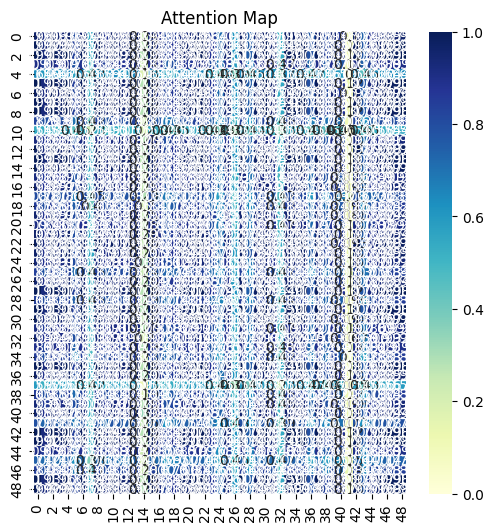

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.0773, grad_fn=<DivBackward1>)


 97%|█████████▋| 29/30 [5:31:24<10:36, 636.08s/it]

Complete 28 th
torch.Size([160, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9929, 0.9208, 0.9831,  ..., 0.9859, 0.9991, 0.9906],
         [0.9999, 0.9554, 0.9968,  ..., 0.9979, 0.9980, 0.9994],
         [1.0000, 0.9593, 0.9978,  ..., 0.9987, 0.9971, 0.9998],
         ...,
         [0.9597, 0.8485, 0.9401,  ..., 0.9453, 0.9785, 0.9547],
         [0.9973, 0.9776, 1.0000,  ..., 0.9997, 0.9885, 0.9984],
         [0.9998, 0.9540, 0.9964,  ..., 0.9976, 0.9983, 0.9993]],

        [[0.9945, 0.9256, 0.9897,  ..., 0.9935, 0.9983, 0.9820],
         [0.9934, 0.9851, 0.9971,  ..., 0.9944, 0.9871, 0.9996],
         [0.9963, 0.9798, 0.9989,  ..., 0.9970, 0.9913, 1.0000],
         ...,
         [0.9902, 0.9891, 0.9949,  ..., 0.9914, 0.9828, 0.9985],
         [0.9972, 0.9775, 0.9994,  ..., 0.9978, 0.9927, 0.9999],
         [0.9998, 0.9538, 0.9983,  ..., 0.9996, 0.9996, 0.9945]],

        [[0.9785, 0.9258, 0.9897,  ..., 0.9881, 0.9677, 0.9894],
         [0.9999, 0.9852, 0.9971,  ..., 0.9979, 0.9993, 0.9973],
         [1.0000, 0.9835, 0.9978,  ..., 0.9985, 0.9

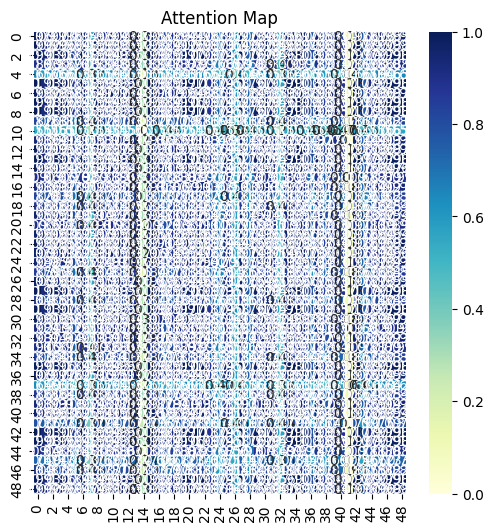

Q_output size: torch.Size([49, 160, 49])
K_output size: torch.Size([49, 160, 49])
V_output size: torch.Size([160, 49, 16])


/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2



Accuracy: tensor(1.)

tensor(397.0349, grad_fn=<DivBackward1>)


100%|██████████| 30/30 [5:41:40<00:00, 683.36s/it]

Complete 29 th


In [48]:
for iepoch in tqdm(range(30)):
    optimizer.zero_grad()
    X_tensor=torch.tensor(X_train)
    predictions=model(X_tensor.float()).squeeze(1)
    #predictions=torch.sign(predictions)
    #print(predictions)
    label=torch.tensor(y_train)
    for i in range(len(label)):
        if label[i]==1:
            label[i] = 0
        else:
            label[i]=1
    #print(label)
    loss = criterion(predictions, label.float())
    acc = binary_accuracy(predictions, label)
    print('')
    print('Accuracy:',acc)
    print('')
    print(loss)
    loss.backward()
    optimizer.step()
    print("Complete "+str(iepoch)+" th")

torch.Size([40, 49, 16])


/home/jaeyeob/anaconda3/envs/lstm/lib/python3.10/site-packages/autoray/autoray.py:81: ComplexWarning: Casting complex values to real discards the imaginary part
  return func(*args, **kwargs)


alpha: tensor([[[0.9944, 0.9967, 0.9900,  ..., 0.9888, 0.9676, 0.9858],
         [0.9933, 0.9549, 0.9968,  ..., 0.9974, 0.9994, 0.9986],
         [1.0000, 0.9831, 0.9992,  ..., 0.9989, 0.9882, 0.9978],
         ...,
         [0.9269, 0.8465, 0.9394,  ..., 0.9421, 0.9718, 0.9480],
         [0.9996, 0.9773, 1.0000,  ..., 0.9998, 0.9923, 0.9993],
         [0.9998, 0.9864, 0.9983,  ..., 0.9978, 0.9852, 0.9964]],

        [[0.9930, 0.9205, 0.9880,  ..., 0.9853, 0.9558, 0.9879],
         [0.9999, 0.9549, 0.9986,  ..., 0.9976, 0.9807, 0.9986],
         [1.0000, 0.9586, 0.9992,  ..., 0.9984, 0.9831, 0.9992],
         ...,
         [0.9592, 0.8465, 0.9483,  ..., 0.9431, 0.8950, 0.9480],
         [0.9990, 0.9706, 1.0000,  ..., 1.0000, 0.9905, 1.0000],
         [0.9998, 0.9532, 0.9983,  ..., 0.9972, 0.9795, 0.9983]],

        [[0.9788, 0.9967, 0.9900,  ..., 0.9883, 0.9596, 0.9926],
         [0.9931, 0.9854, 0.9986,  ..., 0.9980, 0.9807, 0.9995],
         [0.9946, 0.9831, 0.9992,  ..., 0.9987, 0.9

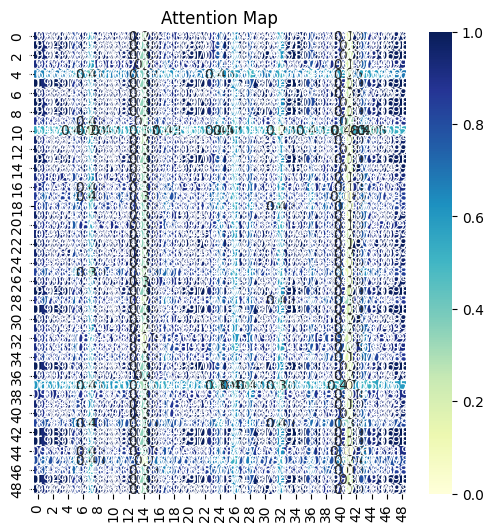

Q_output size: torch.Size([49, 40, 49])
K_output size: torch.Size([49, 40, 49])
V_output size: torch.Size([40, 49, 16])

Accuracy: 0.9750000238418579

Loss: 48.144866943359375

AUROC: 1.0



/tmp/ipykernel_48410/3021993959.py:7: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  rounded_preds = (torch.round(torch.sign(preds-0.5))+1)//2


In [49]:
from sklearn.metrics import roc_auc_score

X_tensor=torch.tensor(X_test)
predictions=model(X_tensor.float()).squeeze(1)
label=torch.tensor(y_test)
for i in range(len(label)):
        if label[i]==1:
            label[i] = 0
        else:
            label[i]=1
loss = criterion(predictions, label.float())
acc = binary_accuracy(predictions, label.float())

# Calculate AUROC
preds_np = predictions.detach().numpy()  # Detach predictions from the graph and convert to numpy
labels_np = label.numpy()  # Convert labels to numpy
auroc = roc_auc_score(labels_np, preds_np)

# Print results
print(f'\nAccuracy: {acc}\n')
print(f'Loss: {loss}\n')
print(f'AUROC: {auroc}\n')

-----------------------------------------